In [3]:
import pandas as pd

votos2019 = pd.read_csv('votacoesVotos-2019.csv', sep=';')


# 2019

In [4]:
votos2019

,idVotacao,uriVotacao,dataHoraVoto,voto,deputado_id,deputado_uri,deputado_nome,deputado_siglaPartido,deputado_uriPartido,deputado_siglaUf,deputado_idLegislatura,deputado_urlFoto
0,16526-506,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-06-17T19:27:01,Não,204554,https://dadosabertos.camara.leg.br/api/v2/depu...,Abílio Santana,PL,https://dadosabertos.camara.leg.br/api/v2/part...,BA,56,https://www.camara.leg.br/internet/deputado/ba...
1,16526-506,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-06-17T19:27:27,Não,204521,https://dadosabertos.camara.leg.br/api/v2/depu...,Abou Anni,PSL,https://dadosabertos.camara.leg.br/api/v2/part...,SP,56,https://www.camara.leg.br/internet/deputado/ba...
2,16526-506,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-06-17T19:29:44,Não,204560,https://dadosabertos.camara.leg.br/api/v2/depu...,Adolfo Viana,PSDB,https://dadosabertos.camara.leg.br/api/v2/part...,BA,56,https://www.camara.leg.br/internet/deputado/ba...
3,16526-506,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-06-17T19:26:40,Não,204528,https://dadosabertos.camara.leg.br/api/v2/depu...,Adriana Ventura,NOVO,https://dadosabertos.camara.leg.br/api/v2/part...,SP,56,https://www.camara.leg.br/internet/deputado/ba...
4,16526-506,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-06-17T19:27:21,Não,121948,https://dadosabertos.camara.leg.br/api/v2/depu...,Adriano do Baldy,PP,https://dadosabertos.camara.leg.br/api/v2/part...,GO,56,https://www.camara.leg.br/internet/deputado/ba...
...,...,...,...,...,...,...,...,...,...,...,...,...
120947,946494-77,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-03-26T21:21:08,Sim,178889,https://dadosabertos.camara.leg.br/api/v2/depu...,Zé Carlos,PT,https://dadosabertos.camara.leg.br/api/v2/part...,MA,56,https://www.camara.leg.br/internet/deputado/ba...
120948,946494-77,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-03-26T21:23:34,Sim,204559,https://dadosabertos.camara.leg.br/api/v2/depu...,Zé Neto,PT,https://dadosabertos.camara.leg.br/api/v2/part...,BA,56,https://www.camara.leg.br/internet/deputado/ba...
120949,946494-77,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-03-26T21:21:02,Sim,160632,https://dadosabertos.camara.leg.br/api/v2/depu...,Zé Silva,SOLIDARIEDADE,https://dadosabertos.camara.leg.br/api/v2/part...,MG,56,https://www.camara.leg.br/internet/deputado/ba...
120950,946494-77,https://dadosabertos.camara.leg.br/api/v2/vota...,2019-03-26T21:21:16,Sim,204517,https://dadosabertos.camara.leg.br/api/v2/depu...,Zé Vitor,PMN,https://dadosabertos.camara.leg.br/api/v2/part...,MG,56,https://www.camara.leg.br/internet/deputado/ba...


In [6]:
votos2019['voto_numerico'] = votos2019['voto'].map({'Sim': 1, 'Não': 0})

# Pivot the data
votes_pivot_2019 = votos2019.pivot_table(index='deputado_nome', columns='idVotacao', values='voto_numerico')

In [10]:
len(votes_pivot_2019.columns)

333

In [8]:
votes_pivot_2019.isna().sum(axis=1).sort_values(ascending=False)

deputado_nome
Simplício Araújo         332
Josias Gomes             331
Guilherme Derrite        331
Reinhold Stephanes       327
Rubens Pereira Júnior    318
                        ... 
Daniel Trzeciak           26
Guiga Peixoto             25
Amaro Neto                25
Sargento Fahur            24
Vinicius Poit             23
Length: 533, dtype: int64

In [12]:
votes_pivot_2019.isna().sum().sort_values(ascending=False)

idVotacao
2230677-4      520
2190638-32     517
2170504-45     512
2191126-33     509
2205332-41     508
              ... 
2192459-798     41
2192459-804     41
2192459-786     39
2192459-795     39
2192459-636     23
Length: 333, dtype: int64

In [13]:
votes_pivot_2019 = votes_pivot_2019.dropna(axis=1, thresh=280)

In [15]:
votes_pivot_2019.isna().sum().sort_values(ascending=False), votes_pivot_2019.isna().sum(axis=1).sort_values(ascending=False)

(idVotacao
 2209381-92     253
 2190237-57     252
 2160860-198    251
 2193564-40     251
 2199310-35     251
               ... 
 2192459-798     41
 2192459-804     41
 2192459-786     39
 2192459-795     39
 2192459-636     23
 Length: 253, dtype: int64,
 deputado_nome
 Reinhold Stephanes       253
 Guilherme Derrite        253
 Simplício Araújo         252
 Josias Gomes             251
 Rubens Pereira Júnior    239
                         ... 
 Guiga Peixoto              5
 Amaro Neto                 5
 Rose Modesto               5
 Fábio Trad                 3
 Sargento Fahur             3
 Length: 533, dtype: int64)

In [16]:
votes_pivot_2019.fillna(0.5, inplace=True)

C:\Users\Luiz Venosa\AppData\Local\Temp\ipykernel_39460\152829309.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  votes_pivot_2019.fillna(0.5, inplace=True)


In [17]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(votes_pivot_2019)
similarity_df_2019 = pd.DataFrame(similarity_matrix, index=votes_pivot_2019.index, columns=votes_pivot_2019.index)

In [18]:
similarity_df_2019

deputado_nome,AJ Albuquerque,Abou Anni,Abílio Santana,Acácio Favacho,Adolfo Viana,Adriana Ventura,Adriano do Baldy,Afonso Florence,Afonso Hamm,Afonso Motta,...,Wladimir Garotinho,Wolney Queiroz,Zeca Dirceu,Zé Carlos,Zé Neto,Zé Silva,Zé Vitor,Átila Lins,Átila Lira,Áurea Carolina
deputado_nome,,,,,,,,,,,,,,,,,,,,,
AJ Albuquerque,1.000000,0.838281,0.889103,0.882195,0.889830,0.780864,0.929951,0.617088,0.882742,0.695316,...,0.840049,0.600378,0.616972,0.597296,0.654372,0.862441,0.843625,0.892762,0.916693,0.615600
Abou Anni,0.838281,1.000000,0.818792,0.825749,0.853589,0.900192,0.850949,0.486088,0.883396,0.582800,...,0.795886,0.504034,0.514409,0.485132,0.564148,0.814399,0.818960,0.804558,0.887038,0.554939
Abílio Santana,0.889103,0.818792,1.000000,0.889979,0.852771,0.753596,0.943116,0.604780,0.837387,0.641487,...,0.857843,0.592413,0.603608,0.584786,0.637221,0.870148,0.855649,0.892410,0.901369,0.561337
Acácio Favacho,0.882195,0.825749,0.889979,1.000000,0.869553,0.781004,0.907741,0.591389,0.844273,0.639229,...,0.832626,0.555848,0.591371,0.569577,0.627076,0.871538,0.856765,0.859103,0.875537,0.558636
Adolfo Viana,0.889830,0.853589,0.852771,0.869553,1.000000,0.807029,0.883114,0.591383,0.858604,0.632456,...,0.810564,0.546324,0.610668,0.580116,0.640020,0.857858,0.869869,0.848635,0.879275,0.598284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zé Silva,0.862441,0.814399,0.870148,0.871538,0.857858,0.731545,0.889929,0.620773,0.830934,0.656666,...,0.844352,0.597912,0.623350,0.604297,0.649728,1.000000,0.851278,0.866634,0.875930,0.586706
Zé Vitor,0.843625,0.818960,0.855649,0.856765,0.869869,0.791869,0.874377,0.603485,0.842534,0.601661,...,0.826711,0.574465,0.624350,0.623144,0.634992,0.851278,1.000000,0.828710,0.859942,0.599984
Átila Lins,0.892762,0.804558,0.892410,0.859103,0.848635,0.724102,0.910523,0.624039,0.815865,0.659366,...,0.829304,0.590766,0.620697,0.604655,0.650898,0.866634,0.828710,1.000000,0.898274,0.586511


In [19]:
import plotly.graph_objects as go
import networkx as nx

names = similarity_df_2019.columns
# Create the graph as before
G = nx.Graph()
for i, name in enumerate(names):
    G.add_node(name)
counter = { name:[] for name in names}
# Add edges with a threshold
threshold = 0.75
for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i][j] > threshold:
            # G.add_edge(names[i], names[j], weight=similarity_matrix[i][j])
            counter[names[i]].append((names[j], similarity_matrix[i][j]))
for source, target in counter.items():
    selected_targets = sorted(target, key=lambda x: x[1], reverse=True)[:26]
    for target, weight in selected_targets:
        G.add_edge(source, target, weight=weight)
            


In [23]:
pos = nx.spring_layout(G, k=0.1,  iterations=50, seed=69)

In [24]:


# Create Edges
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

# Add edges as a scatter plot
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
# Create Nodes
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)


# Add nodes as a scatter plot
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', hoverinfo='text', marker=dict(showscale=True, colorscale='YlGnBu', size=10, color=[], line_width=2))

# Add text to the nodes
node_trace.text = list(G.nodes())

# Create a figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(showlegend=False, hovermode='closest', margin=dict(b=0,l=0,r=0,t=0), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

fig.show()


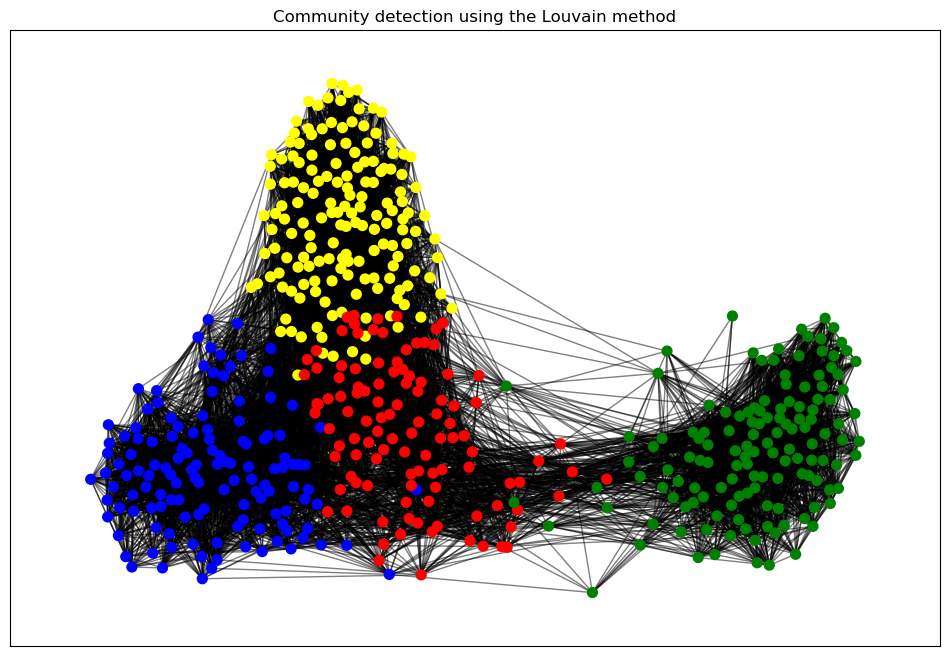

In [25]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create your graph (G) or load it if you already have it
# Example: G = nx.read_edgelist('your_edge_list.txt', nodetype=int, data=(('weight', float),))

# Step 1: Detect communities using the Louvain method
partition = community_louvain.best_partition(G, random_state=29)

# Step 2: Create a color map based on the partition
colors = ['red' if x == 3 else 'blue' if x == 1 else 'yellow' if x == 0 else 'green' for x in partition.values()]


# Step 3: Draw the graph with community colors
  # You can use any layout you prefer
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color=colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community detection using the Louvain method")

plt.show()

In [26]:
centrao_2019 = [x for x, i in partition.items() if i == 3 or i == 0]

In [27]:
centrao_2019

['AJ Albuquerque',
 'Abílio Santana',
 'Acácio Favacho',
 'Adolfo Viana',
 'Adriano do Baldy',
 'Aguinaldo Ribeiro',
 'Alan Rick',
 'Alcides Rodrigues',
 'Alexandre Leite',
 'Alexandre Serfiotis',
 'Aline Gurgel',
 'Altineu Côrtes',
 'Aluisio Mendes',
 'Amaro Neto',
 'André Abdon',
 'André Ferreira',
 'André Fufuca',
 'André de Paula',
 'Antonio Brito',
 'Aníbal Gomes',
 'Aroldo Martins',
 'Arthur Lira',
 'Arthur Oliveira Maia',
 'Augusto Coutinho',
 'Aureo Ribeiro',
 'Aécio Neves',
 'Baleia Rossi',
 'Benes Leocádio',
 'Beto Rosado',
 'Bilac Pinto',
 'Bosco Costa',
 'Bosco Saraiva',
 'Bruna Furlan',
 'Cacá Leão',
 'Capitão Augusto',
 'Capitão Fábio Abreu',
 'Carlos Bezerra',
 'Carlos Gomes',
 'Carlos Henrique Gaguim',
 'Carlos Sampaio',
 'Celina Leão',
 'Celso Maldaner',
 'Celso Russomanno',
 'Celso Sabino',
 'Cezinha de Madureira',
 'Charles Fernandes',
 'Chiquinho Brazão',
 'Christiane de Souza Yared',
 'Christino Aureo',
 'Claudio Cajado',
 'Cleber Verde',
 'Cristiano Vale',
 'Danie

# 2015

In [28]:
votos2015 = pd.read_csv('votacoesVotos-2015.csv', sep=';')
votos2015['voto_numerico'] = votos2015['voto'].map({'Sim': 1, 'Não': 0})

# Pivot the data
votes_pivot_2015 = votos2015.pivot_table(index='deputado_nome', columns='idVotacao', values='voto_numerico')
votes_pivot_2015 = votes_pivot_2015.dropna(axis=1, thresh=280)
votes_pivot_2015.fillna(0.5, inplace=True)


# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(votes_pivot_2015)
similarity_df_2015 = pd.DataFrame(similarity_matrix, index=votes_pivot_2015.index, columns=votes_pivot_2015.index)

In [30]:
import plotly.graph_objects as go
import networkx as nx

names = similarity_df_2015.columns
# Create the graph as before
G = nx.Graph()
for i, name in enumerate(names):
    G.add_node(name)
counter = { name:[] for name in names}
# Add edges with a threshold
threshold = 0.75
for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i][j] > threshold:
            # G.add_edge(names[i], names[j], weight=similarity_matrix[i][j])
            counter[names[i]].append((names[j], similarity_matrix[i][j]))
for source, target in counter.items():
    selected_targets = sorted(target, key=lambda x: x[1], reverse=True)[:26]
    for target, weight in selected_targets:
        G.add_edge(source, target, weight=weight)
            


In [33]:
pos = nx.spring_layout(G, k=0.1,  iterations=50, seed=180)

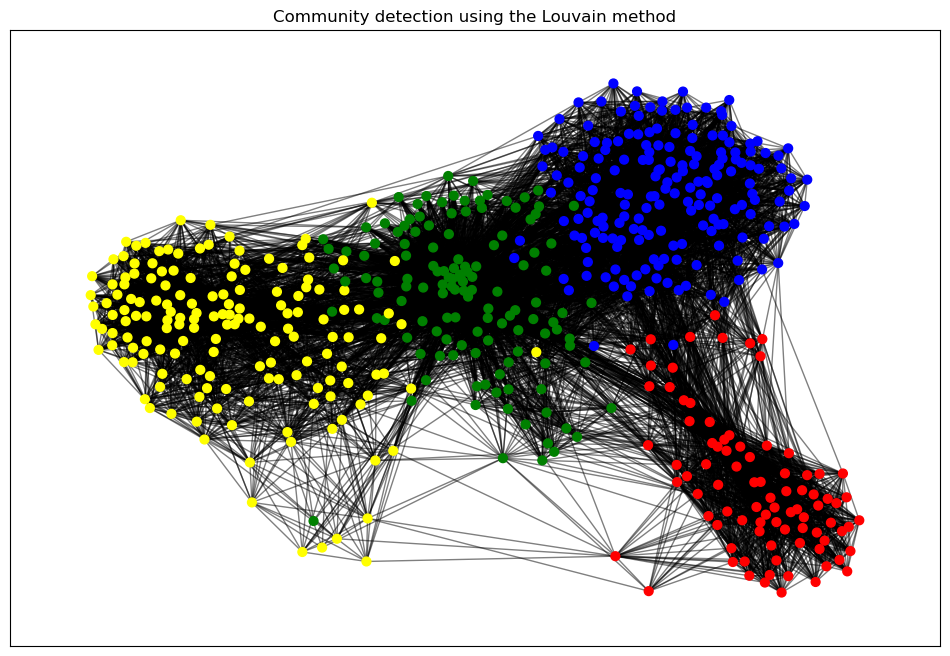

In [35]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create your graph (G) or load it if you already have it
# Example: G = nx.read_edgelist('your_edge_list.txt', nodetype=int, data=(('weight', float),))

# Step 1: Detect communities using the Louvain method
partition = community_louvain.best_partition(G, random_state=29)

# Step 2: Create a color map based on the partition
colors = ['red' if x == 3 else 'blue' if x == 1 else 'yellow' if x == 0 else 'green' for x in partition.values()]


# Step 3: Draw the graph with community colors
  # You can use any layout you prefer
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=40, node_color=colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community detection using the Louvain method")

plt.show()

In [37]:
centrao_2015 = [x for x, i in partition.items() if i == 2 or i == 1]

In [36]:


# Create Edges
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

# Add edges as a scatter plot
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
# Create Nodes
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)


# Add nodes as a scatter plot
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', hoverinfo='text', marker=dict(showscale=True, colorscale='YlGnBu', size=10, color=[], line_width=2))

# Add text to the nodes
node_trace.text = list(G.nodes())

# Create a figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(showlegend=False, hovermode='closest', margin=dict(b=0,l=0,r=0,t=0), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

fig.show()


# 2011

In [121]:
votos2011 = pd.read_csv('votacoesVotos-2011.csv', sep=';')
votos2011['voto_numerico'] = votos2011['voto'].map({'Sim': 1, 'Não': 0})

# Pivot the data
votes_pivot_2011 = votos2011.pivot_table(index='deputado_nome', columns='idVotacao', values='voto_numerico')
votes_pivot_2011 = votes_pivot_2011.dropna(axis=1, thresh=280)
votes_pivot_2011.fillna(0.5, inplace=True)


# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(votes_pivot_2011)
similarity_df_2011 = pd.DataFrame(similarity_matrix, index=votes_pivot_2011.index, columns=votes_pivot_2011.index)

In [128]:
import plotly.graph_objects as go
import networkx as nx

names = similarity_df_2011.columns
# Create the graph as before
G = nx.Graph()
for i, name in enumerate(names):
    G.add_node(name)
counter = { name:[] for name in names}
# Add edges with a threshold
threshold = 0.75
for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i][j] > threshold:
            # G.add_edge(names[i], names[j], weight=similarity_matrix[i][j])
            counter[names[i]].append((names[j], similarity_matrix[i][j]))
for source, target in counter.items():
    selected_targets = sorted(target, key=lambda x: x[1], reverse=True)[:26]
    for target, weight in selected_targets:
        G.add_edge(source, target, weight=weight)
            


In [129]:
pos = nx.spring_layout(G, k=0.25,  iterations=50, seed=14)

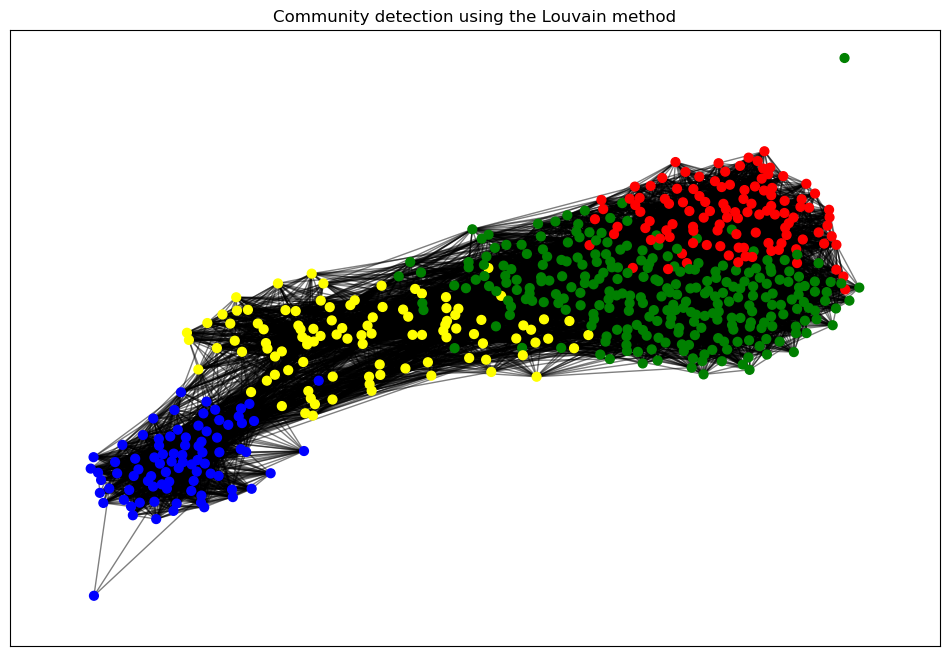

In [130]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create your graph (G) or load it if you already have it
# Example: G = nx.read_edgelist('your_edge_list.txt', nodetype=int, data=(('weight', float),))

# Step 1: Detect communities using the Louvain method
partition = community_louvain.best_partition(G, random_state=29)

# Step 2: Create a color map based on the partition
colors = ['red' if x == 3 else 'blue' if x == 1 else 'yellow' if x == 0 else 'green' for x in partition.values()]


# Step 3: Draw the graph with community colors
  # You can use any layout you prefer
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=40, node_color=colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community detection using the Louvain method")

plt.show()

In [131]:
from collections import Counter



counter = Counter(partition.values())

for number, count in counter.items():
    print(f"Number {number} appears {count} times in the partition.")

Number 0 appears 101 times in the partition.
Number 1 appears 84 times in the partition.
Number 2 appears 99 times in the partition.
Number 3 appears 111 times in the partition.
Number 4 appears 165 times in the partition.
Number 5 appears 1 times in the partition.


In [137]:
centrao_2011 = [x for x, i in partition.items() if i == 0 or i == 2 or i == 4 or i ==5]

# 2007

In [52]:
votos2007 = pd.read_csv('votacoesVotos-2007.csv', sep=';')
votos2007['voto_numerico'] = votos2007['voto'].map({'Sim': 1, 'Não': 0})

# Pivot the data
votes_pivot_2007 = votos2007.pivot_table(index='deputado_nome', columns='idVotacao', values='voto_numerico')
votes_pivot_2007 = votes_pivot_2007.dropna(axis=1, thresh=280)
votes_pivot_2007.fillna(0.5, inplace=True)


# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(votes_pivot_2007)
similarity_df_2007 = pd.DataFrame(similarity_matrix, index=votes_pivot_2007.index, columns=votes_pivot_2007.index)

In [53]:
import plotly.graph_objects as go
import networkx as nx

names = similarity_df_2007.columns
# Create the graph as before
G = nx.Graph()
for i, name in enumerate(names):
    G.add_node(name)
counter = { name:[] for name in names}
# Add edges with a threshold
threshold = 0.75
for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i][j] > threshold:
            # G.add_edge(names[i], names[j], weight=similarity_matrix[i][j])
            counter[names[i]].append((names[j], similarity_matrix[i][j]))
for source, target in counter.items():
    selected_targets = sorted(target, key=lambda x: x[1], reverse=True)[:26]
    for target, weight in selected_targets:
        G.add_edge(source, target, weight=weight)
            


In [79]:
pos = nx.spring_layout(G, k=0.1,  iterations=50, seed=94)

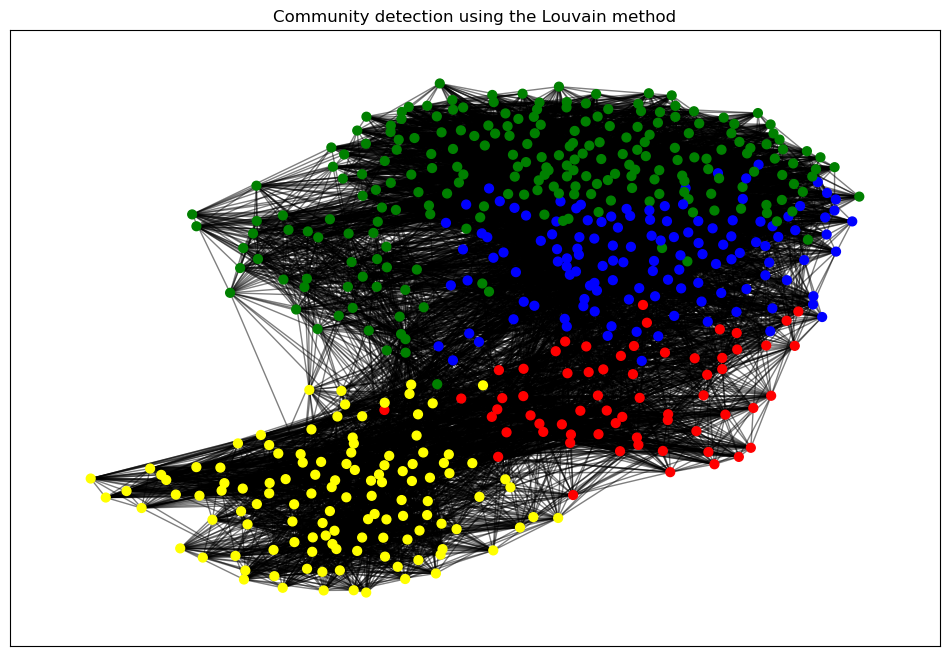

In [80]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create your graph (G) or load it if you already have it
# Example: G = nx.read_edgelist('your_edge_list.txt', nodetype=int, data=(('weight', float),))

# Step 1: Detect communities using the Louvain method
partition = community_louvain.best_partition(G, random_state=18, resolution=1)

# Step 2: Create a color map based on the partition
colors = ['red' if x == 3 else 'blue' if x == 1 else 'yellow' if x == 0 else 'green' for x in partition.values()]


# Step 3: Draw the graph with community colors
  # You can use any layout you prefer
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=40, node_color=colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community detection using the Louvain method")

plt.show()

In [74]:
from collections import Counter



counter = Counter(partition.values())

for number, count in counter.items():
    print(f"Number {number} appears {count} times in the partition.")

Number 0 appears 158 times in the partition.
Number 1 appears 117 times in the partition.
Number 2 appears 115 times in the partition.
Number 3 appears 86 times in the partition.
Number 5 appears 60 times in the partition.
Number 6 appears 1 times in the partition.
Number 7 appears 3 times in the partition.
Number 4 appears 1 times in the partition.


In [63]:
centrao_2007 = [x for x, i in partition.items() if i == 0 or i == 2 or i == 5]

In [58]:


# Create Edges
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

# Add edges as a scatter plot
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
# Create Nodes
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)


# Add nodes as a scatter plot
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', hoverinfo='text', marker=dict(showscale=True, colorscale='YlGnBu', size=10, color=[], line_width=2))

# Add text to the nodes
node_trace.text = list(G.nodes())

# Create a figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(showlegend=False, hovermode='closest', margin=dict(b=0,l=0,r=0,t=0), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

fig.show()


# 2003

In [75]:
votos2003 = pd.read_csv('votacoesVotos-2003.csv', sep=';')
votos2003['voto_numerico'] = votos2003['voto'].map({'Sim': 1, 'Não': 0})

# Pivot the data
votes_pivot_2003 = votos2003.pivot_table(index='deputado_nome', columns='idVotacao', values='voto_numerico')
votes_pivot_2003 = votes_pivot_2003.dropna(axis=1, thresh=280)
votes_pivot_2003.fillna(0.5, inplace=True)


# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(votes_pivot_2003)
similarity_df_2003 = pd.DataFrame(similarity_matrix, index=votes_pivot_2003.index, columns=votes_pivot_2003.index)

In [103]:
import plotly.graph_objects as go
import networkx as nx

names = similarity_df_2003.columns
# Create the graph as before
G = nx.Graph()
for i, name in enumerate(names):
    G.add_node(name)
counter = { name:[] for name in names}
# Add edges with a threshold
threshold = 0.85
for i in range(len(similarity_matrix)):
    for j in range(i + 1, len(similarity_matrix)):
        if similarity_matrix[i][j] > threshold:
            # G.add_edge(names[i], names[j], weight=similarity_matrix[i][j])
            counter[names[i]].append((names[j], similarity_matrix[i][j]))
for source, target in counter.items():
    selected_targets = sorted(target, key=lambda x: x[1], reverse=True)[:26]
    for target, weight in selected_targets:
        G.add_edge(source, target, weight=weight)
            


In [104]:
pos = nx.spring_layout(G, k=0.1,  iterations=50, seed=94)

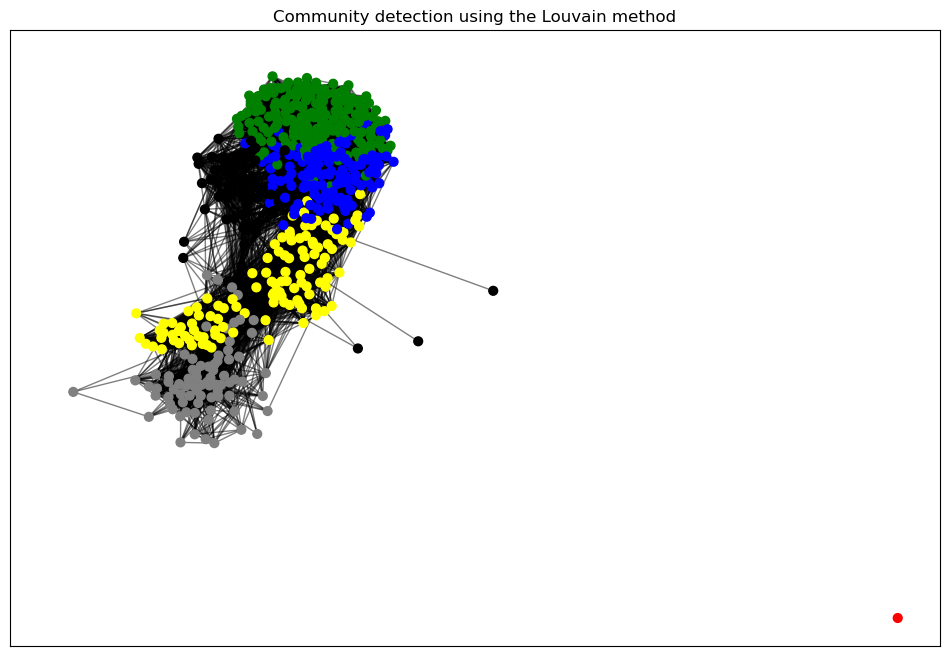

In [110]:
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt

# Create your graph (G) or load it if you already have it
# Example: G = nx.read_edgelist('your_edge_list.txt', nodetype=int, data=(('weight', float),))

# Step 1: Detect communities using the Louvain method
partition = community_louvain.best_partition(G, random_state=88, resolution=1)

# Step 2: Create a color map based on the partition
colors = ['red' if x == 3 else 'blue' if x == 1 else 'yellow' if x == 4 else 'green' if x == 2 else 'grey' if x ==0 else 'black'  for x in partition.values()]


# Step 3: Draw the graph with community colors
  # You can use any layout you prefer
plt.figure(figsize=(12, 8))
nx.draw_networkx_nodes(G, pos, node_size=40, node_color=colors)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community detection using the Louvain method")

plt.show()

In [113]:
centrao_2003 = [x for x, i in partition.items() if i == 5 or i == 1 or i == 4]

In [106]:
from collections import Counter



counter = Counter(partition.values())

for number, count in counter.items():
    print(f"Number {number} appears {count} times in the partition.")

Number 3 appears 73 times in the partition.
Number 1 appears 132 times in the partition.
Number 2 appears 173 times in the partition.
Number 4 appears 104 times in the partition.
Number 5 appears 51 times in the partition.
Number 0 appears 1 times in the partition.


In [107]:


# Create Edges
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

# Add edges as a scatter plot
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
# Create Nodes
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)


# Add nodes as a scatter plot
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', hoverinfo='text', marker=dict(showscale=True, colorscale='YlGnBu', size=10, color=[], line_width=2))

# Add text to the nodes
node_trace.text = list(G.nodes())

# Create a figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(showlegend=False, hovermode='closest', margin=dict(b=0,l=0,r=0,t=0), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

fig.show()


# ____________________________________________________________________________________________________

In [138]:
pd.Series(centrao_2003).to_csv('centrao_2003.csv', index=False)
pd.Series(centrao_2007).to_csv('centrao_2007.csv', index=False)
pd.Series(centrao_2011).to_csv('centrao_2011.csv', index=False)
pd.Series(centrao_2015).to_csv('centrao_2015.csv', index=False)
pd.Series(centrao_2019).to_csv('centrao_2019.csv', index=False)